# Bifurcation Diagrams

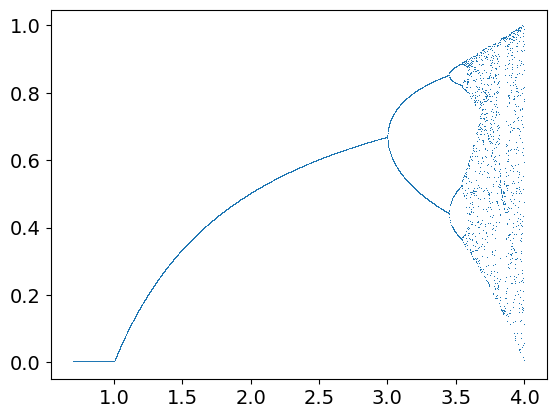

In [612]:
import matplotlib.pyplot as plt
import numpy as np
P=np.linspace(0.7,4,10000)
m=0.7
# Initialize your data containers identically
X = []
Y = []
# l is never used, I removed it.
for u in P:
    # Add one value to X instead of resetting it.
    X.append(u)
    # Start with a random value of m instead of remaining stuck
    # on a particular branch of the diagram
    m = np.random.random()
    for n in range(1001):
      m=(u*m)*(1-m)
    # The break is harmful here as it prevents completion of
    # the loop and collection of data in Y 
    for l in range(1051):
      m=(u*m)*(1-m)
    # Collection of data in Y must be done once per value of u
    Y.append(m)
# Remove the line between successive data points, this renders
# the plot illegible. Use a small marker instead.
plt.plot(X, Y, ls='', marker=',')
plt.show()

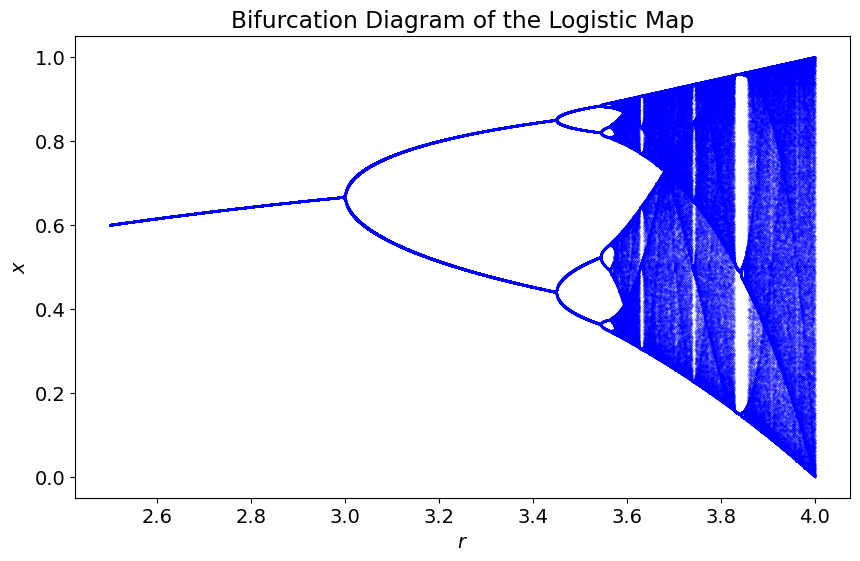

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Parameters
r_values = np.linspace(2.5, 4.0, 10000)  # Range of r values
iterations = 1000  # Total iterations
last = 100  # Number of iterations to plot (after transient)

# Prepare the bifurcation diagram
x = 1e-5 * np.ones(len(r_values))  # Initial condition
bifurcation_x, bifurcation_r = [], []

for _ in range(iterations):
    x = r_values * x * (1 - x)  # Logistic map
    if _ >= (iterations - last):  # Collect steady-state values
        bifurcation_r.append(r_values)
        bifurcation_x.append(x)

# Convert lists to arrays for plotting
bifurcation_r = np.array(bifurcation_r).flatten()
bifurcation_x = np.array(bifurcation_x).flatten()

# Plot the bifurcation diagram
plt.figure(figsize=(10, 6))
plt.scatter(bifurcation_r, bifurcation_x, s=0.01, color='blue')
plt.title("Bifurcation Diagram of the Logistic Map")
plt.xlabel("$r$")
plt.ylabel("$x$")
plt.show()


# This code simulates and visualizes the bifurcation diagram for a system of coupled logistic map oscillators as a function of the coupling parameter.

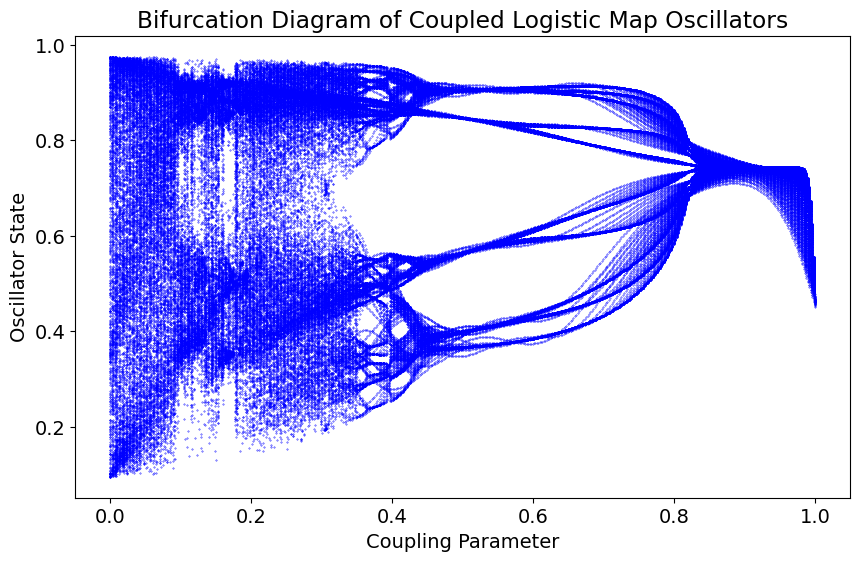

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Parameters
num_maps = 5             # Number of coupled maps
iterations = 100            # Total iterations
transient = 10              # Transient iterations to discard
coupling_values = np.linspace(0, 1, 500)  # Coupling parameter range
r = 3.9           # Logistic map parameter
initial_conditions = np.random.rand(num_maps)  # Initial conditions

# Logistic map function
def logistic_map(x, r):
    return r * x * (1 - x)

# Coupled map system
def coupled_map(x, coupling, r):
    n = len(x)
    new_x = np.zeros_like(x)
    for i in range(n):
        local_coupling = coupling * (x[(i + 1) % n] + x[i - 1]) / 2  # Nearest-neighbor coupling
        new_x[i] = (1 - coupling) * logistic_map(x[i], r) + local_coupling
    return new_x

# Initialize bifurcation diagram data
bifurcation_x = []
bifurcation_y = []

# Iterate over coupling values
for coupling in coupling_values:
    x = initial_conditions.copy()
    # Iterate the map and skip transient
    for _ in range(transient):
        x = coupled_map(x, coupling, r)
    # Record values after transient
    for _ in range(iterations - transient):
        x = coupled_map(x, coupling, r)
        bifurcation_x.extend([coupling] * len(x))  # Record coupling parameter
        bifurcation_y.extend(x)  # Record oscillator states

# Plot the bifurcation diagram
plt.figure(figsize=(10, 6))
plt.scatter(bifurcation_x, bifurcation_y, s=0.1, c='blue')
plt.title("Bifurcation Diagram of Coupled Logistic Map Oscillators")
plt.xlabel("Coupling Parameter")
plt.ylabel("Oscillator State")
plt.show()


# Spatio-Temporal Pattern

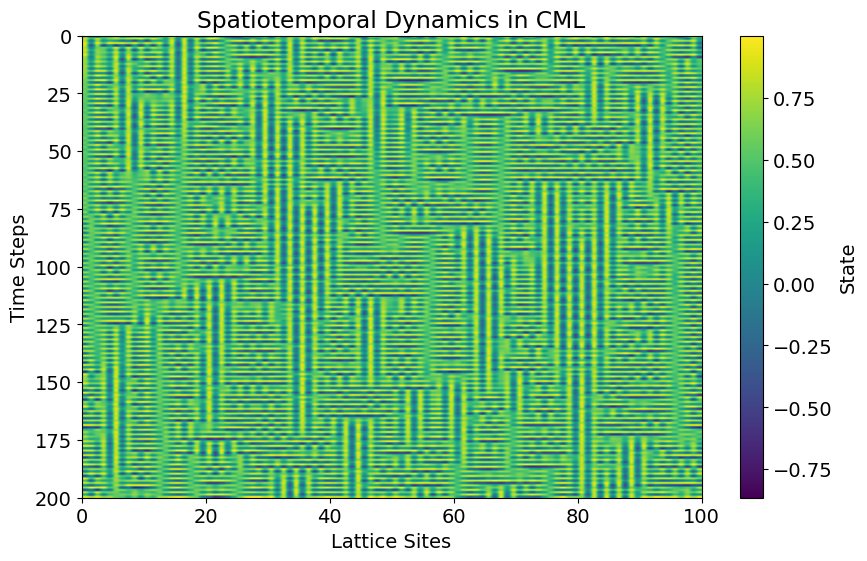

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Function for the logistic map
def logistic_map(x, a):
    return 1 - a * x**2

# Canonical CML
def coupled_map_lattice(N, T, a, epsilon, initial_condition="random"):
    """
    Simulates the canonical coupled map lattice (CML).
    
    Parameters:
        N : int
            Number of lattice sites.
        T : int
            Number of time steps.
        a : float
            Parameter in the logistic map (nonlinearity).
        epsilon : float
            Coupling strength.
        initial_condition : str
            "random" for random initial states, "uniform" for identical states.
    
    Returns:
        lattice : np.ndarray
            The spatiotemporal evolution of the lattice (T x N array).
    """
    # Initialize the lattice
    if initial_condition == "random":
        lattice = np.random.uniform(-1, 1, (T, N))
    elif initial_condition == "uniform":
        lattice = np.ones((T, N)) * 0.5  # Start from 0.5 for all sites
    
    # Iterate the CML
    for t in range(T - 1):
        for i in range(N):
            left_neighbor = lattice[t, (i - 1) % N]  # Periodic boundary
            right_neighbor = lattice[t, (i + 1) % N]  # Periodic boundary
            local = logistic_map(lattice[t, i], a)
            lattice[t + 1, i] = (1 - epsilon) * local + epsilon / 2 * (
                logistic_map(left_neighbor, a) + logistic_map(right_neighbor, a)
            )
    
    return lattice

# Visualization
def plot_cml(lattice, title="Coupled Map Lattice"):
    plt.figure(figsize=(10, 6))
    plt.imshow(lattice, cmap="viridis", aspect="auto", extent=[0, lattice.shape[1], lattice.shape[0], 0])
    plt.colorbar(label="State")
    plt.xlabel("Lattice Sites")
    plt.ylabel("Time Steps")
    plt.title(title)
    plt.show()

# Parameters for the CML
N = 100            # Number of lattice sites
T = 200            # Number of time steps
a = 1.75           # Logistic map parameter (nonlinearity)
epsilon = 0.95  # Coupling strength

# Simulate and plot
lattice = coupled_map_lattice(N, T, a, epsilon)
plot_cml(lattice, title="Spatiotemporal Dynamics in CML")


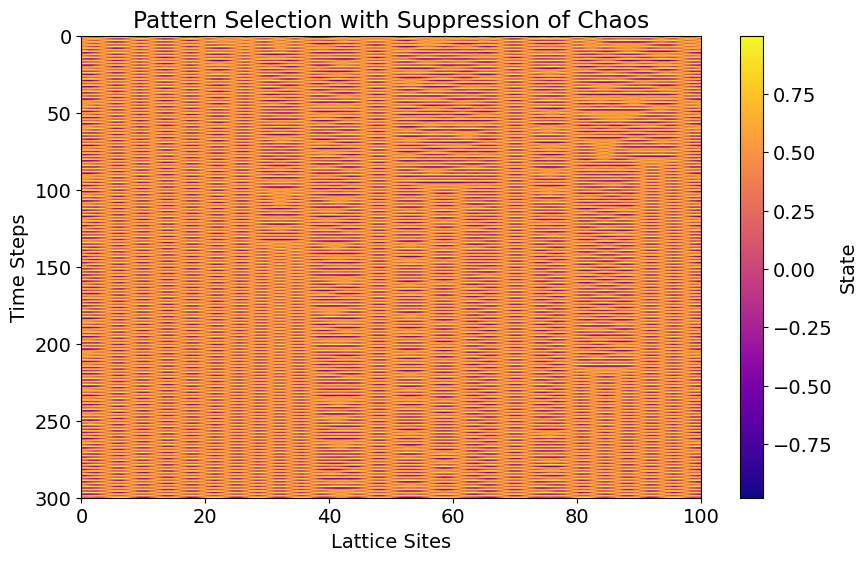

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Logistic map function
def logistic_map(x, a):
    return 1 - a * x**2

# Coupled Map Lattice with Pattern Selection
def coupled_map_lattice_pattern_selection(N, T, a, epsilon):
    """
    Simulates a CML showing pattern selection with suppression of chaos.

    Parameters:
        N : int
            Number of lattice sites.
        T : int
            Number of time steps.
        a : float
            Logistic map parameter (nonlinearity).
        epsilon : float
            Coupling strength.

    Returns:
        lattice : np.ndarray
            Spatiotemporal evolution of the lattice (T x N array).
    """
    # Initialize the lattice with random values
    lattice = np.random.uniform(-1, 1, (T, N))

    # Iterate over time
    for t in range(T - 1):
        for i in range(N):
            left_neighbor = lattice[t, (i - 1) % N]  # Periodic boundary condition
            right_neighbor = lattice[t, (i + 1) % N]  # Periodic boundary condition
            local = logistic_map(lattice[t, i], a)
            lattice[t + 1, i] = (1 - epsilon) * local + epsilon / 2 * (
                logistic_map(left_neighbor, a) + logistic_map(right_neighbor, a)
            )
    
    return lattice

# Visualization function
def plot_pattern_selection(lattice, title="Pattern Selection with Suppression of Chaos"):
    plt.figure(figsize=(10, 6))
    plt.imshow(
        lattice,
        cmap="plasma",
        aspect="auto",
        extent=[0, lattice.shape[1], lattice.shape[0], 0],
    )
    plt.colorbar(label="State")
    plt.xlabel("Lattice Sites")
    plt.ylabel("Time Steps")
    plt.title(title)
    plt.show()

# Parameters for Pattern Selection
N = 100             # Number of lattice sites
T = 300             # Number of time steps
a = 1.6       # Logistic map parameter (moderate nonlinearity)
epsilon = 0.4      # Strong coupling (suppresses chaos)

# Simulate and visualize
lattice = coupled_map_lattice_pattern_selection(N, T, a, epsilon)
plot_pattern_selection(lattice, title="Pattern Selection with Suppression of Chaos")


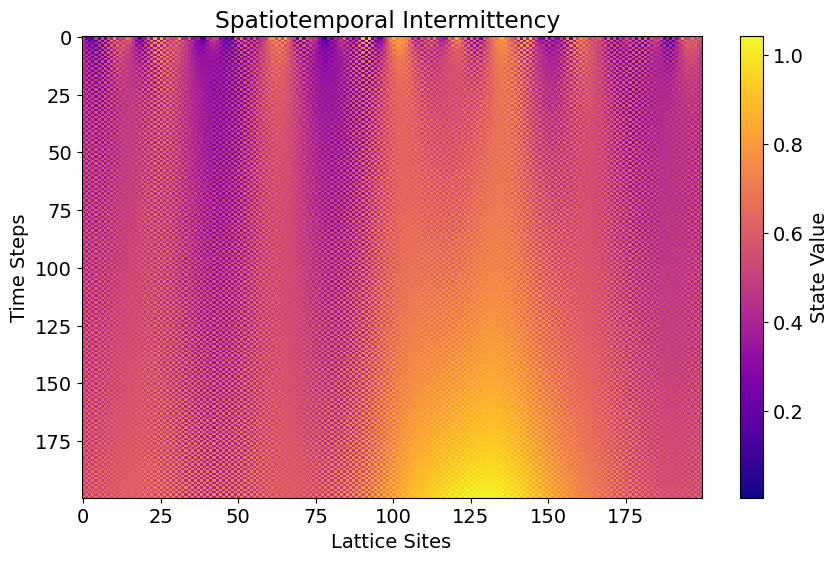

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# Parameters
L = 200               
T = 200             
eps = 1.005  
a = 1.5             

lattice = np.random.rand(L)
def logistic_map(x, a):
    return a * x * (1 - x)
def update(lattice, eps, a):
    new_lattice = np.zeros_like(lattice)
    for i in range(L):
        # Coupling with nearest neighbors with periodic boundary conditions
        left = lattice[i - 1] if i > 0 else lattice[-1]
        right = lattice[i + 1] if i < L - 1 else lattice[0]
        local = logistic_map(lattice[i], a)
        
        # Coupled map equation
        new_lattice[i] = (1 - eps) * local + (eps / 2) * (left + right)
    
    return new_lattice
evolution = np.zeros((T, L))
evolution[0, :] = lattice
for t in range(1, T):
    lattice = update(lattice, eps, a)
    evolution[t, :] = lattice


fig, ax = plt.subplots(figsize=(10, 6))
im = ax.imshow(evolution, cmap="plasma", aspect="auto", interpolation="nearest")
ax.set_xlabel("Lattice Sites")
ax.set_ylabel("Time Steps")
fig.colorbar(im, label="State Value")

plt.title("Spatiotemporal Intermittency ")
plt.show()


# Different Patterns 

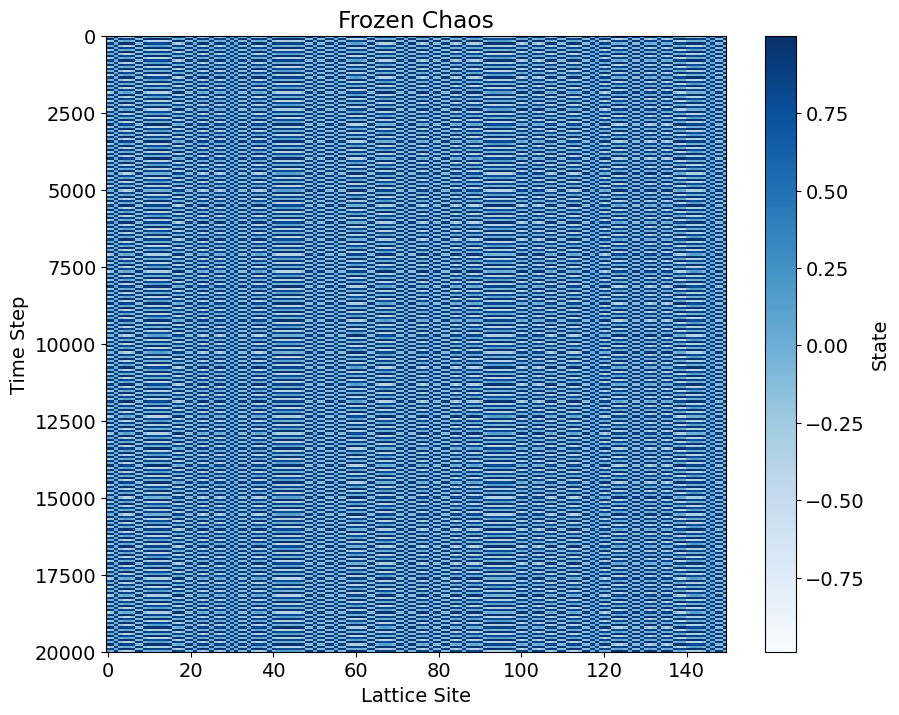

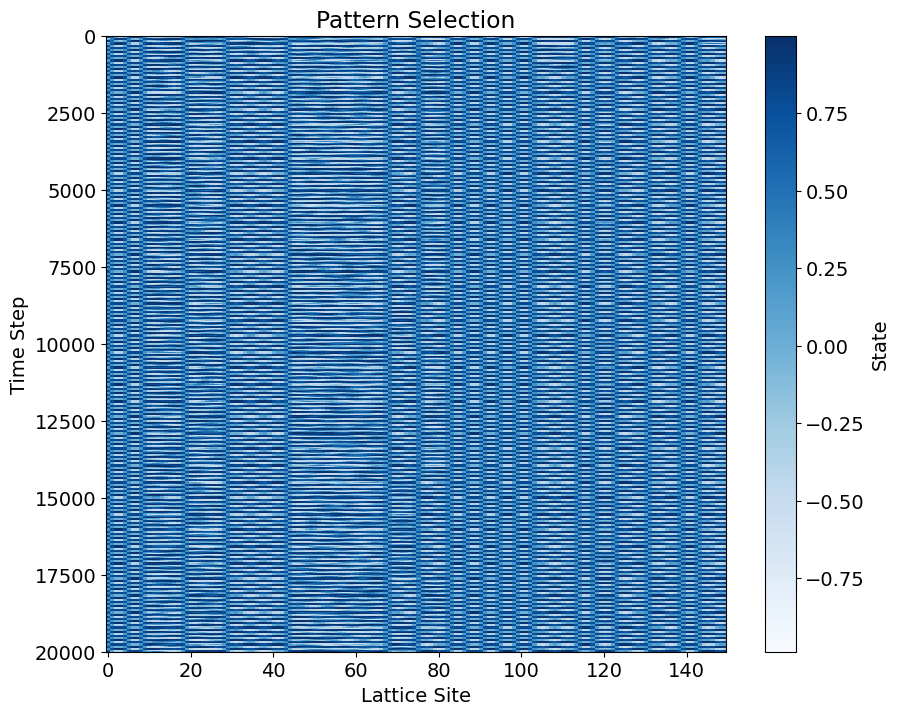

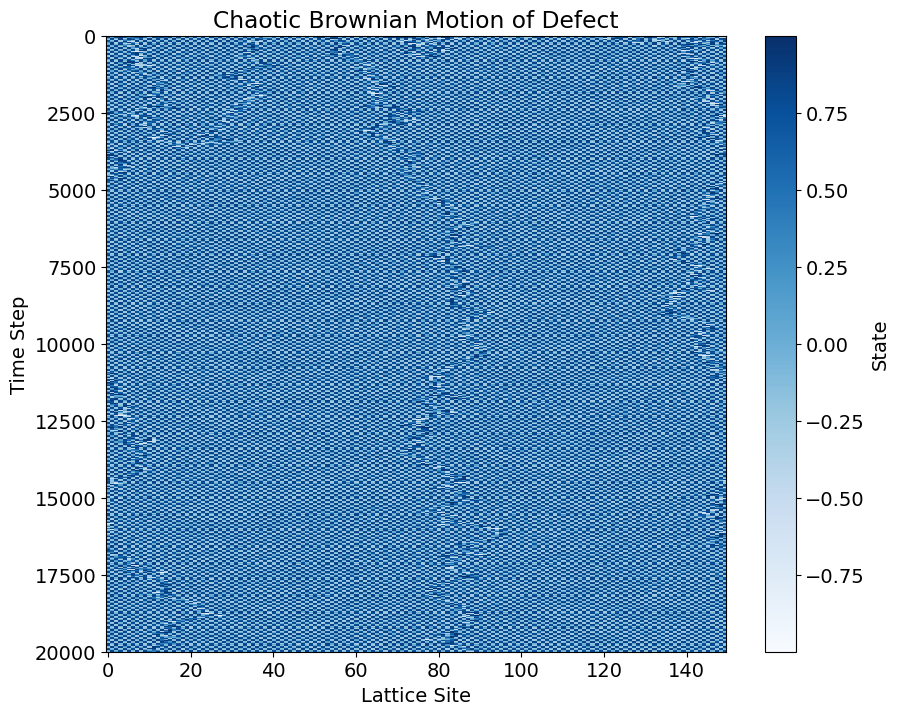

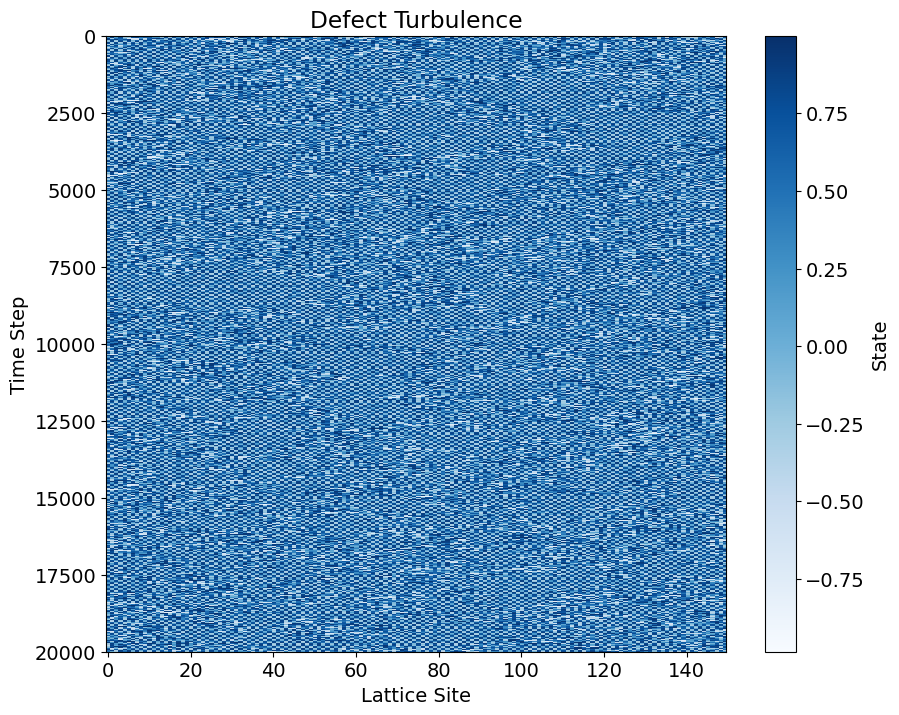

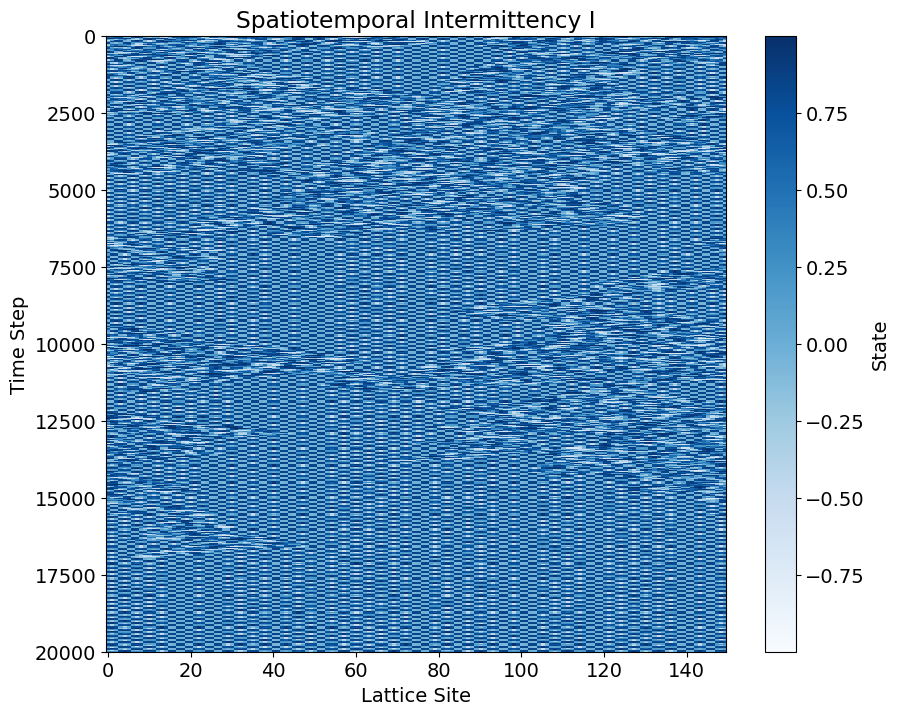

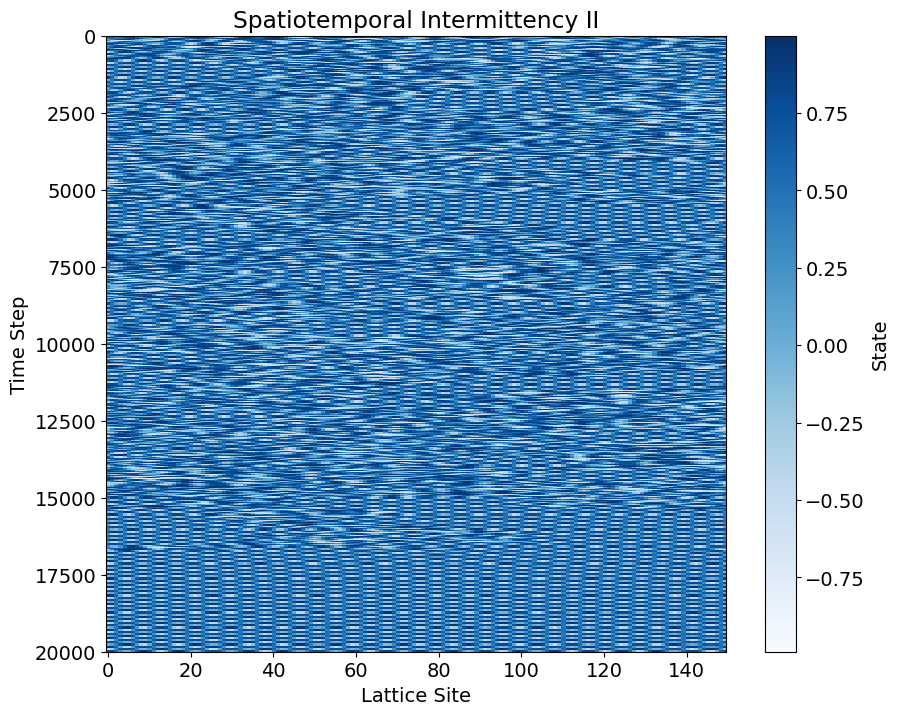

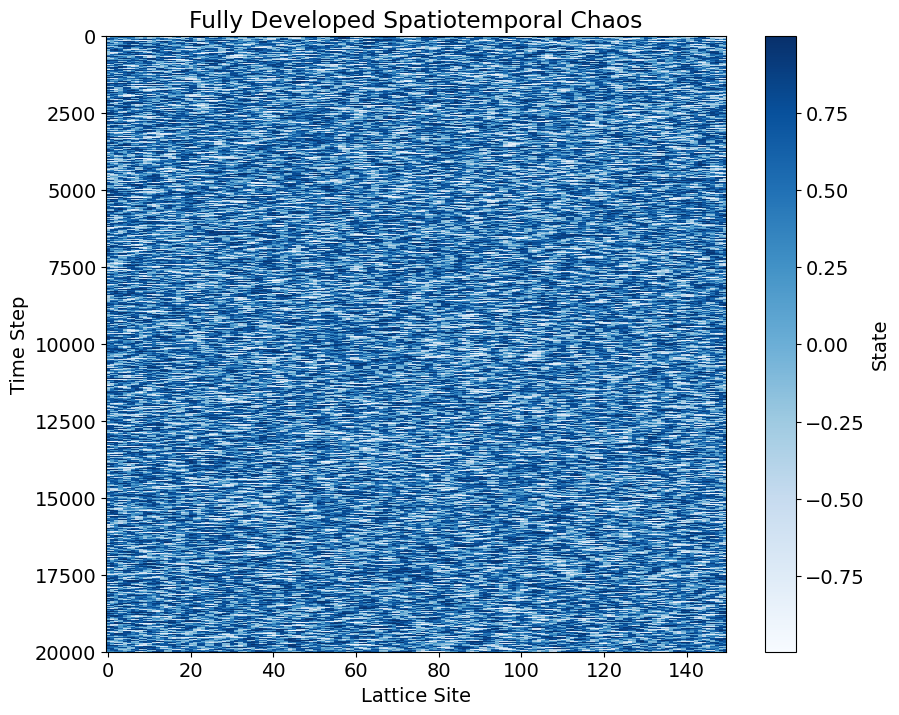

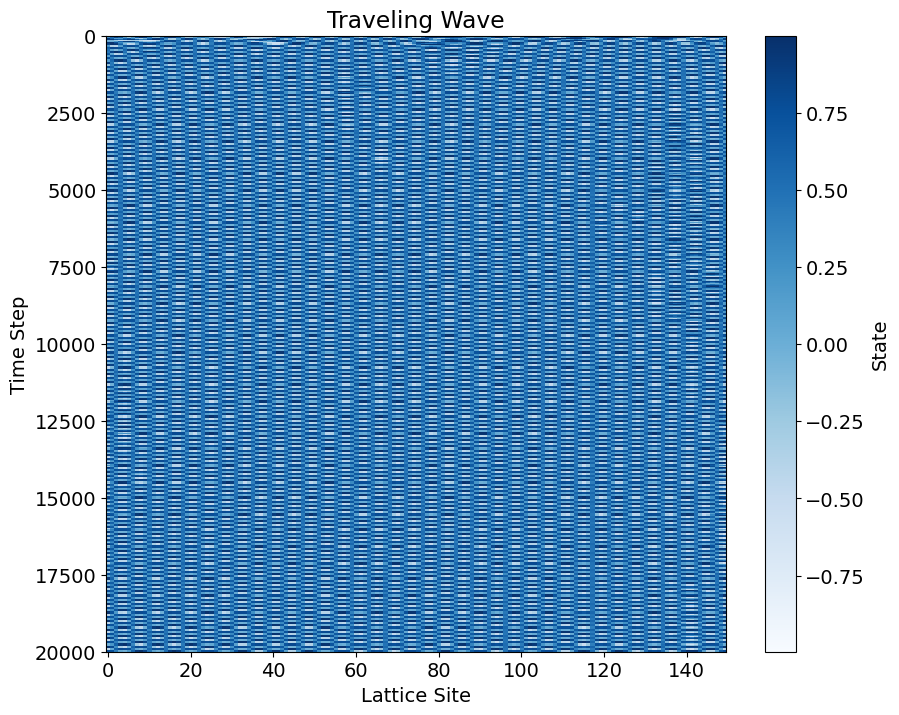

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Parameters
N = 150  # Number of lattice sites
T = 20000  # Number of time steps

# Logistic map function
def logistic_map(x, a):
    return 1 - a * x**2

# CML update function
def update_cml(lattice, a, g):
    new_lattice = np.zeros_like(lattice)
    for i in range(len(lattice)):
        left = lattice[i - 1] if i > 0 else lattice[-1]  # Periodic boundary
        right = lattice[i + 1] if i < len(lattice) - 1 else lattice[0]
        new_lattice[i] = (1 - g) * logistic_map(lattice[i], a) + \
                         g / 2 * (logistic_map(left, a) + logistic_map(right, a))
    return new_lattice

# Simulate CML for given parameters
def simulate_cml(N, T, a, g, initial_condition="random"):
    # Initialize lattice
    if initial_condition == "random":
        lattice = np.random.uniform(-1, 1, N)
    elif initial_condition == "uniform":
        lattice = np.full(N, 0.5)
    elif initial_condition == "localized":
        lattice = np.zeros(N)
        lattice[N // 2] = 0.9  # Localized perturbation
    history = [lattice]
    
    # Update lattice for T time steps
    for _ in range(T):
        lattice = update_cml(lattice, a, g)
        history.append(lattice)
    return np.array(history)

# Visualization function
def plot_spatiotemporal(history, title):
    plt.figure(figsize=(10, 8))
    plt.imshow(history, aspect="auto", cmap="Blues", interpolation="nearest")
    plt.colorbar(label="State")
    plt.title(title)
    plt.xlabel("Lattice Site")
    plt.ylabel("Time Step")
    plt.show()

# Scenarios and parameter settings
scenarios = [
    {"a": 1.40, "g": 0.1, "title": "Frozen Chaos"},
    {"a": 1.55, "g": 0.4, "title": "Pattern Selection"},
    {"a": 1.85, "g": 0.1, "title": "Chaotic Brownian Motion of Defect"},
    {"a": 1.895, "g": 0.1, "title": "Defect Turbulence"},
    {"a": 1.75, "g": 0.3, "title": "Spatiotemporal Intermittency I"},
    {"a": 1.75, "g": 0.6, "title": "Spatiotemporal Intermittency II"},
    {"a": 2.0, "g": 0.3, "title": "Fully Developed Spatiotemporal Chaos"},
    {"a": 1.67, "g": 0.5, "title": "Traveling Wave"},
]

# Simulate and plot each scenario
for scenario in scenarios:
    history = simulate_cml(N, T, scenario["a"], scenario["g"])
    plot_spatiotemporal(history, scenario["title"])


# Global Mapping

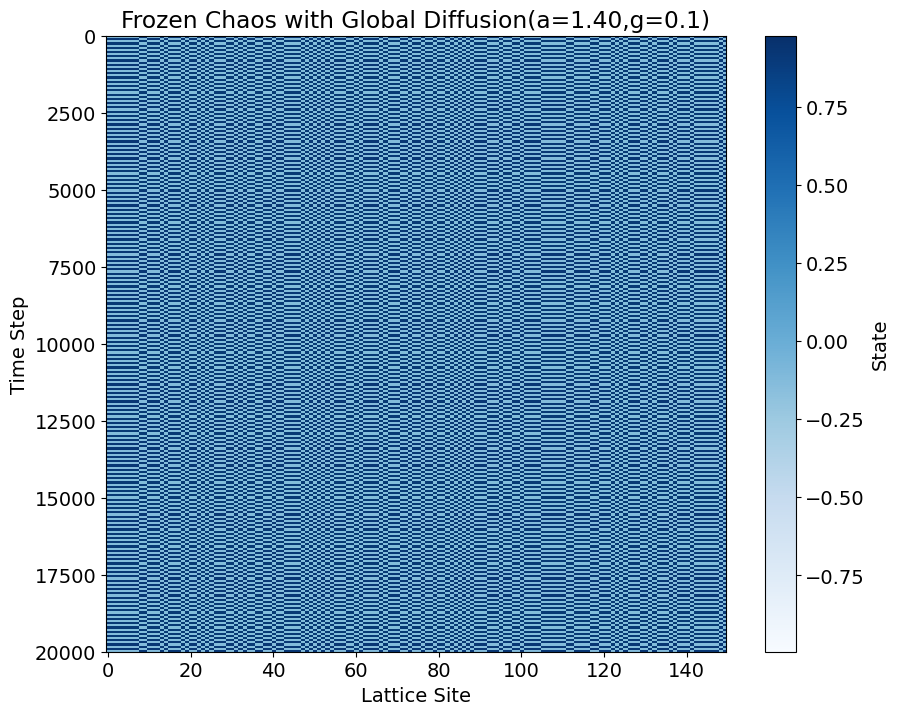

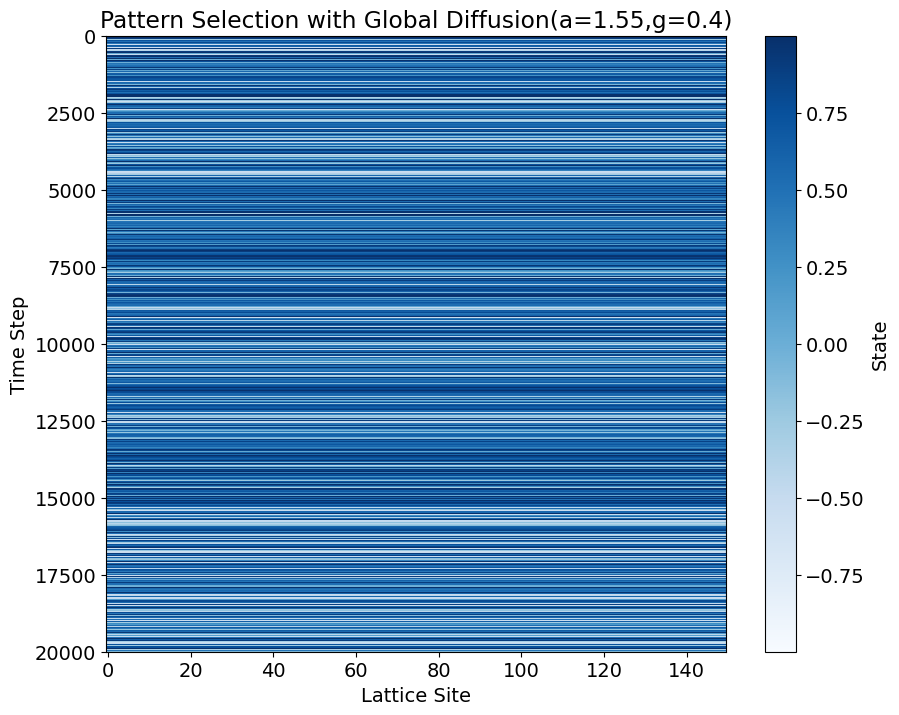

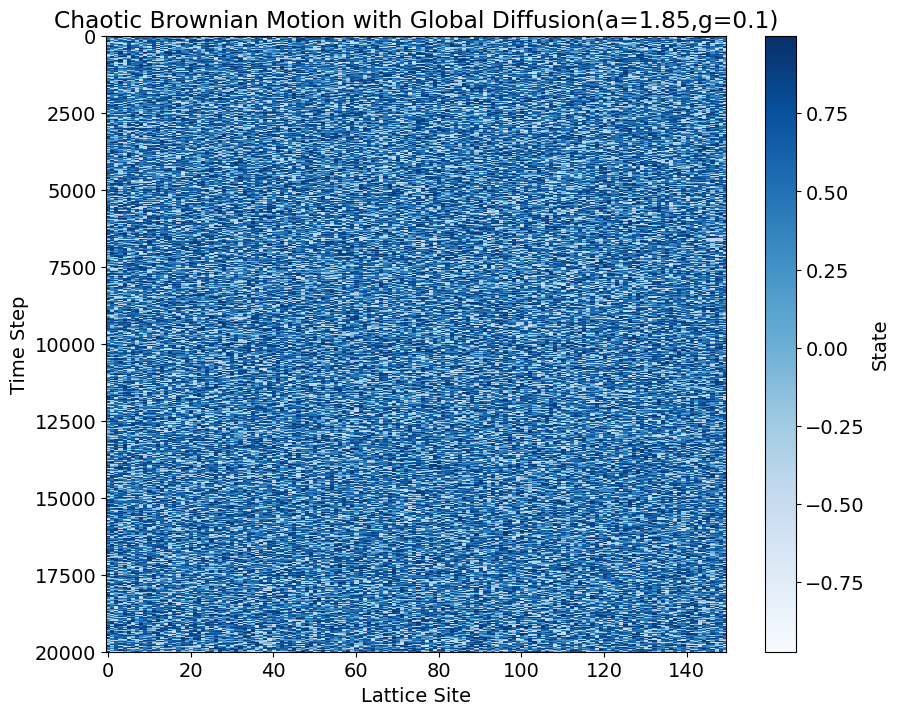

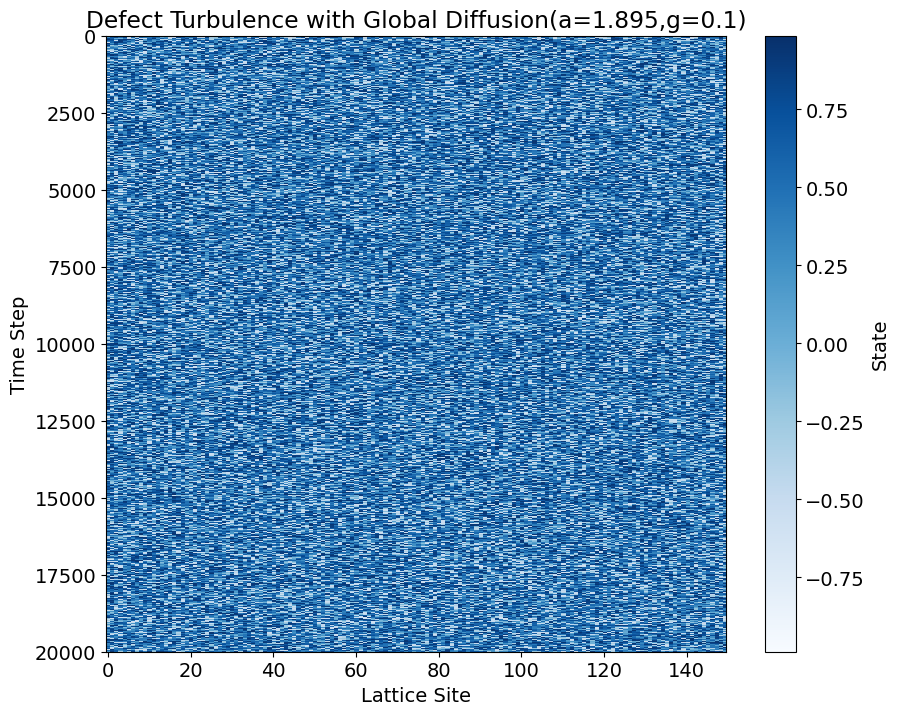

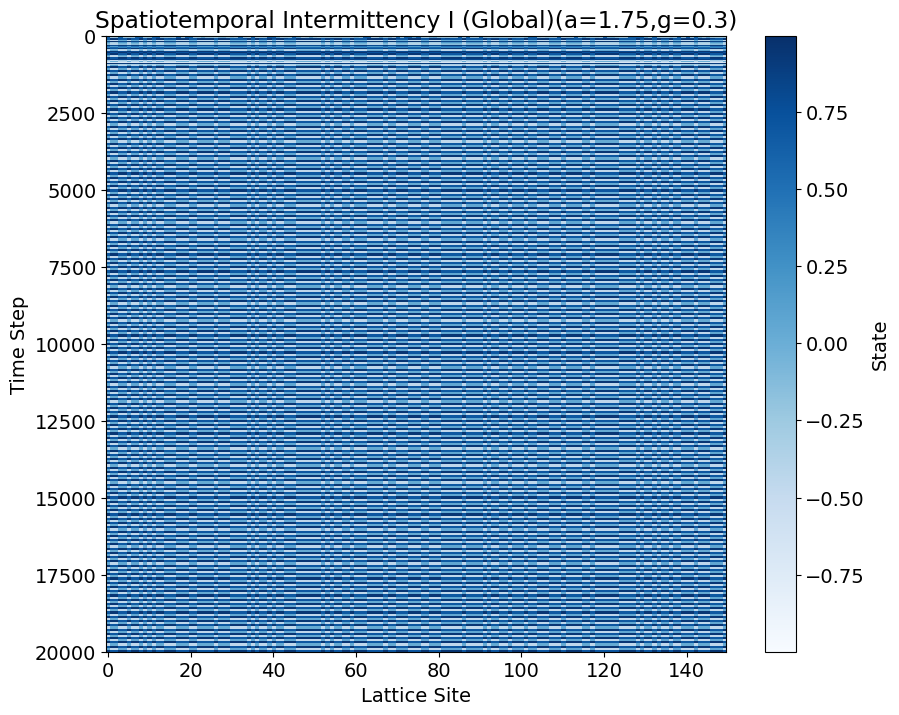

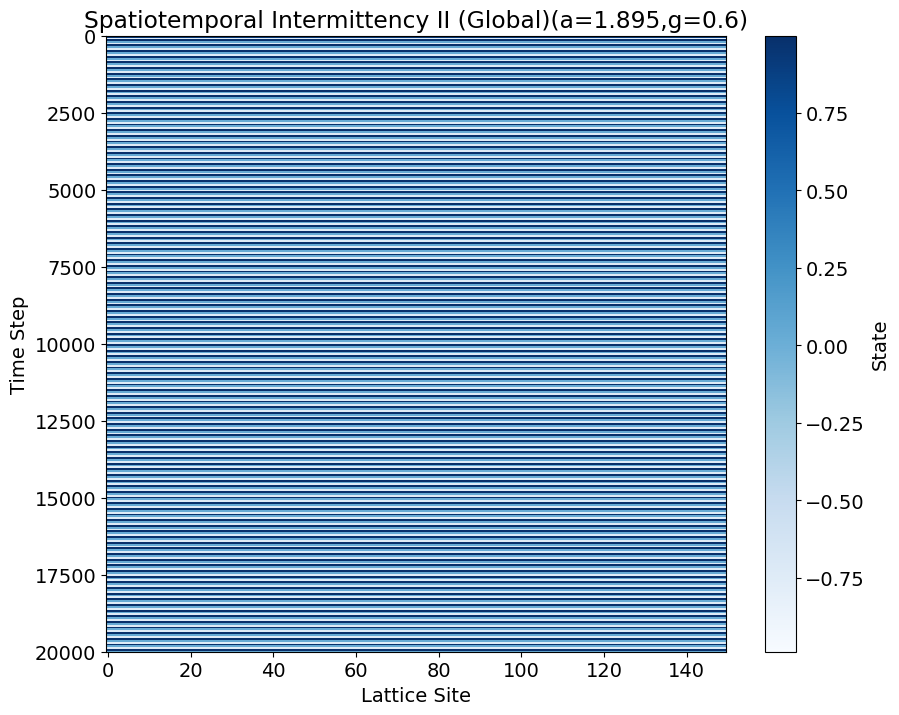

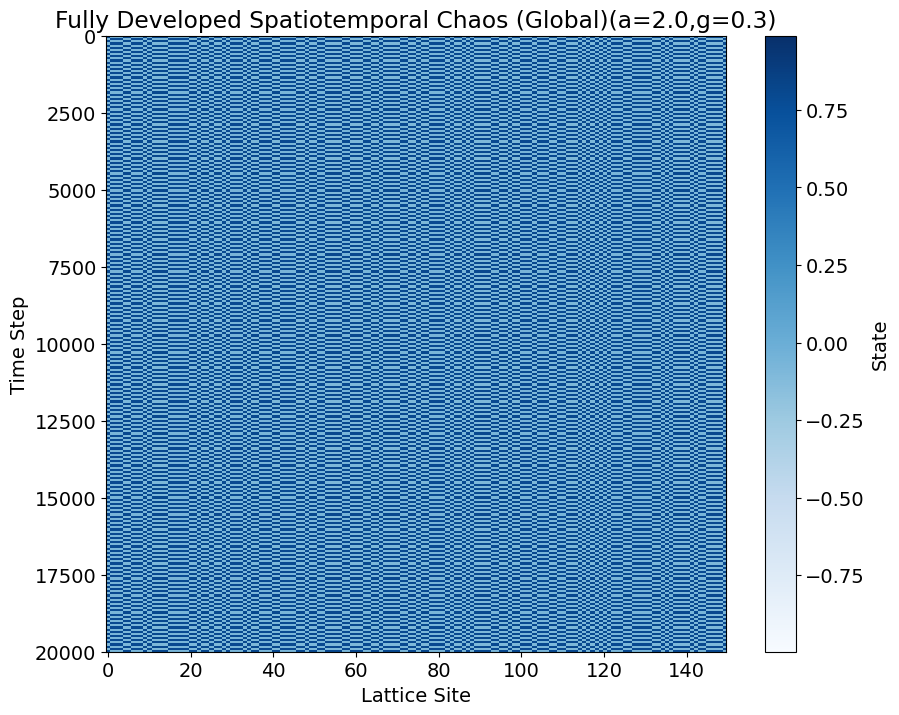

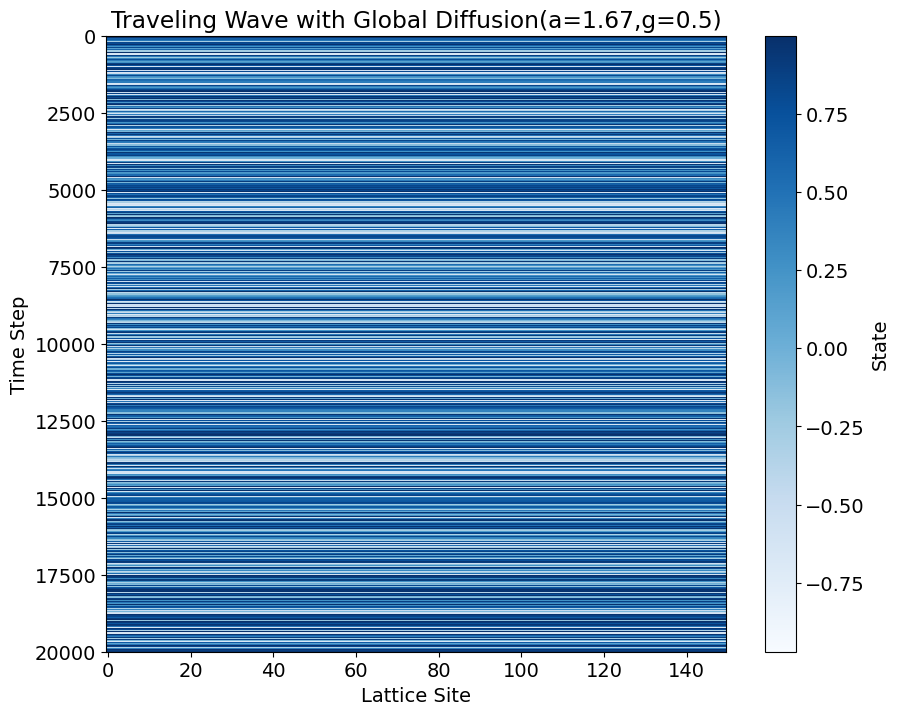

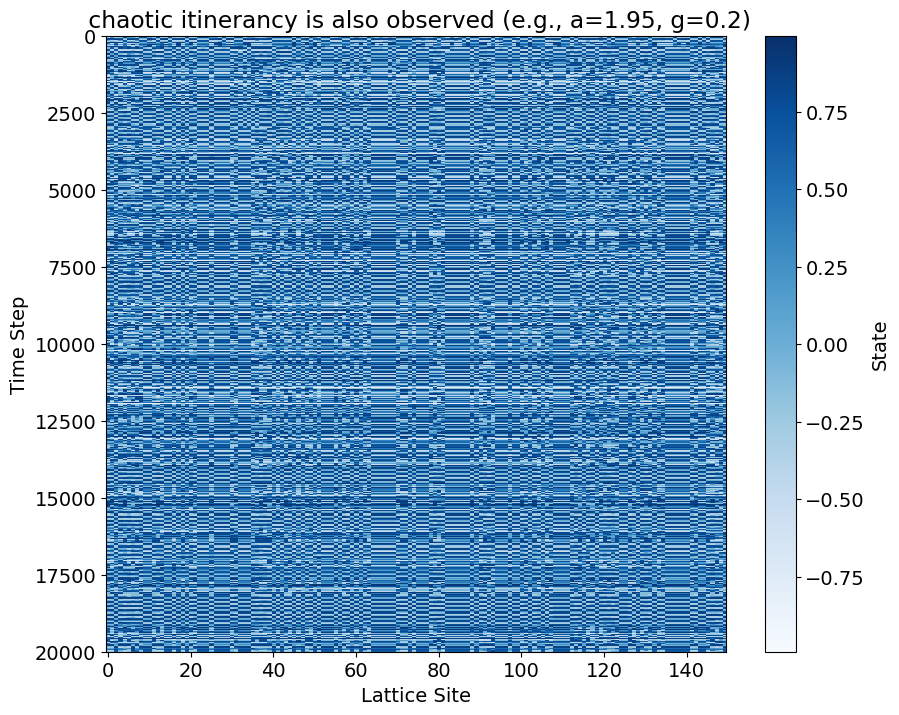

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Parameters
N = 150    # Number of lattice sites
T = 20000  # Number of time steps

# Logistic map function
def logistic_map(x, a):
    return 1 - a * x**2

# CML update function with global diffusion
def update_cml_global(lattice, a, g):
    new_lattice = np.zeros_like(lattice)
    mean_value = np.mean(logistic_map(lattice, a))  # Global average
    for i in range(len(lattice)):
        new_lattice[i] = (1 - g) * logistic_map(lattice[i], a) + g * mean_value
    return new_lattice

# Simulate CML for given parameters
def simulate_cml_global(N, T, a, g, initial_condition="random"):
    # Initialize lattice
    if initial_condition == "random":
        lattice = np.random.uniform(-1, 1, N)
    elif initial_condition == "uniform":
        lattice = np.full(N, 0.5)
    elif initial_condition == "localized":
        lattice = np.zeros(N)
        lattice[N // 2] = 0.9  # Localized perturbation
    history = [lattice]
    
    # Update lattice for T time steps
    for _ in range(T):
        lattice = update_cml_global(lattice, a, g)
        history.append(lattice)
    return np.array(history)

# Visualization function
def plot_spatiotemporal(history, title):
    plt.figure(figsize=(10, 8))
    plt.imshow(history, aspect="auto", cmap="Blues", interpolation="nearest")
    plt.colorbar(label="State")
    plt.title(title)
    plt.xlabel("Lattice Site")
    plt.ylabel("Time Step")
    plt.show()

# Scenarios and parameter settings for global diffusion
scenarios = [
    {"a": 1.40, "g": 0.1, "title": "Frozen Chaos with Global Diffusion(a=1.40,g=0.1)"},
    {"a": 1.55, "g": 0.4, "title": "Pattern Selection with Global Diffusion(a=1.55,g=0.4)"},
    {"a": 1.85, "g": 0.1, "title": "Chaotic Brownian Motion with Global Diffusion(a=1.85,g=0.1)"},
    {"a": 1.895, "g": 0.1, "title": "Defect Turbulence with Global Diffusion(a=1.895,g=0.1)"},
    {"a": 1.75, "g": 0.3, "title": "Spatiotemporal Intermittency I (Global)(a=1.75,g=0.3)"},
    {"a": 1.75, "g": 0.6, "title": "Spatiotemporal Intermittency II (Global)(a=1.895,g=0.6)"},
    {"a": 2.0, "g": 0.3, "title": "Fully Developed Spatiotemporal Chaos (Global)(a=2.0,g=0.3)"},
    {"a": 1.67, "g": 0.5, "title": "Traveling Wave with Global Diffusion(a=1.67,g=0.5)"},
    {"a": 1.95, "g": 0.2, "title": " chaotic itinerancy is also observed (e.g., a=1.95, g=0.2)"}
]

# Simulate and plot each scenario
for scenario in scenarios:
    history = simulate_cml_global(N, T, scenario["a"], scenario["g"])
    plot_spatiotemporal(history, scenario["title"])


# Slightly Different Approach

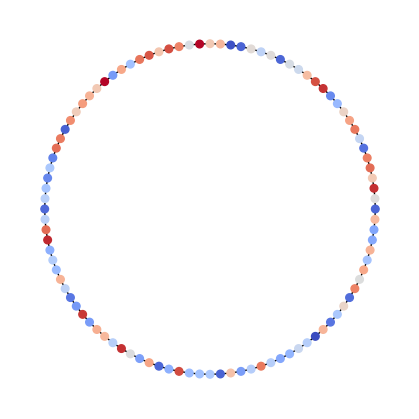

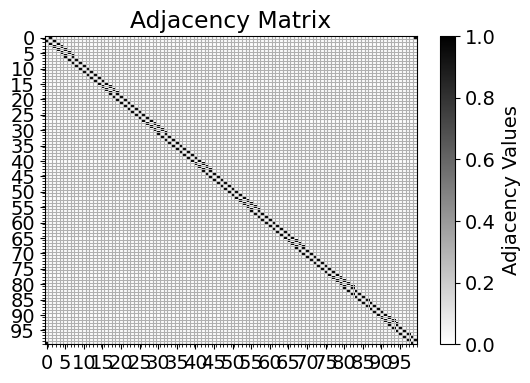

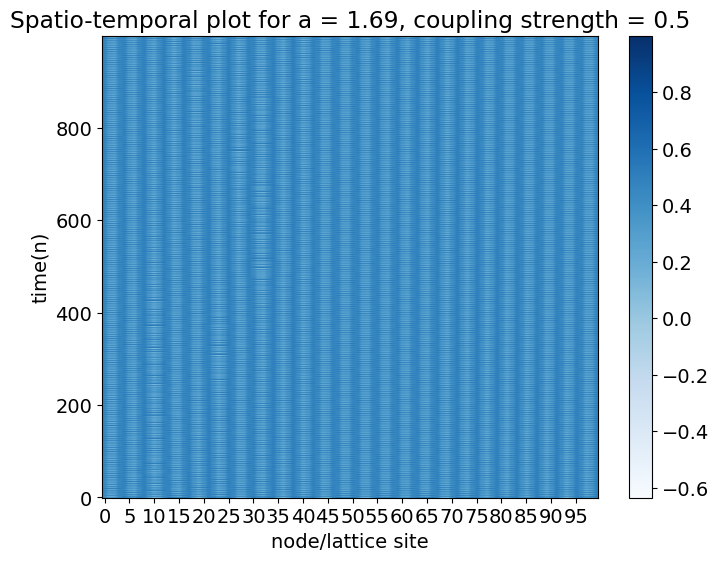

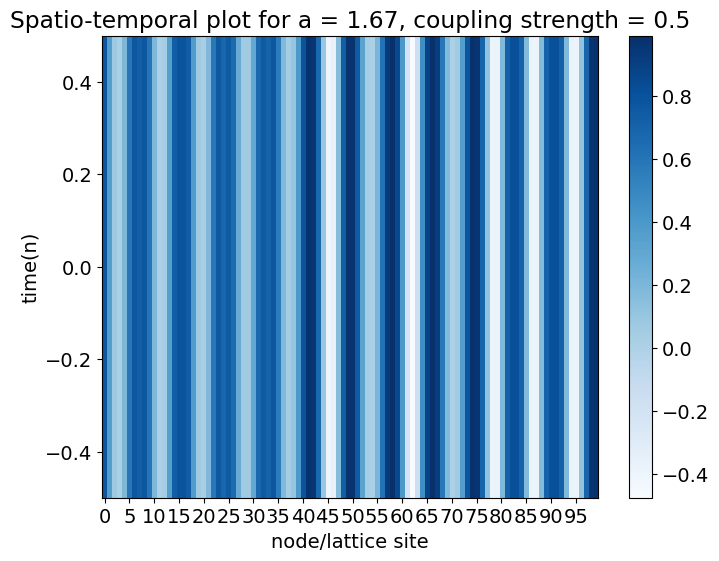

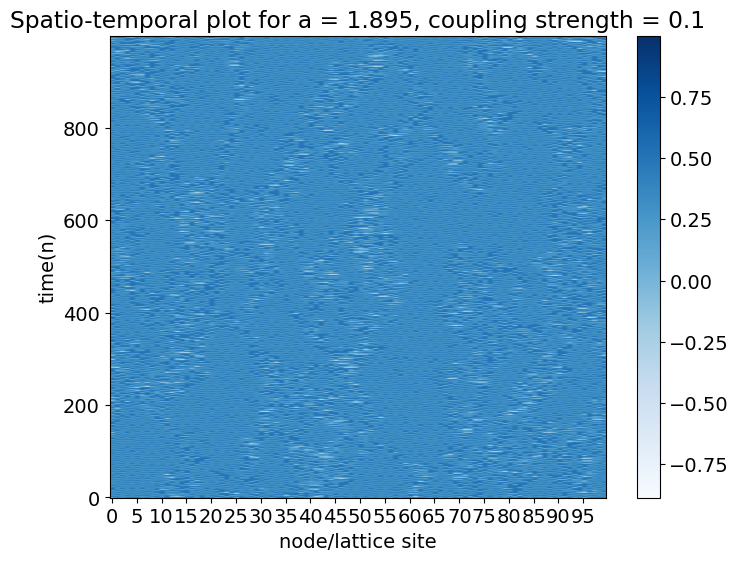

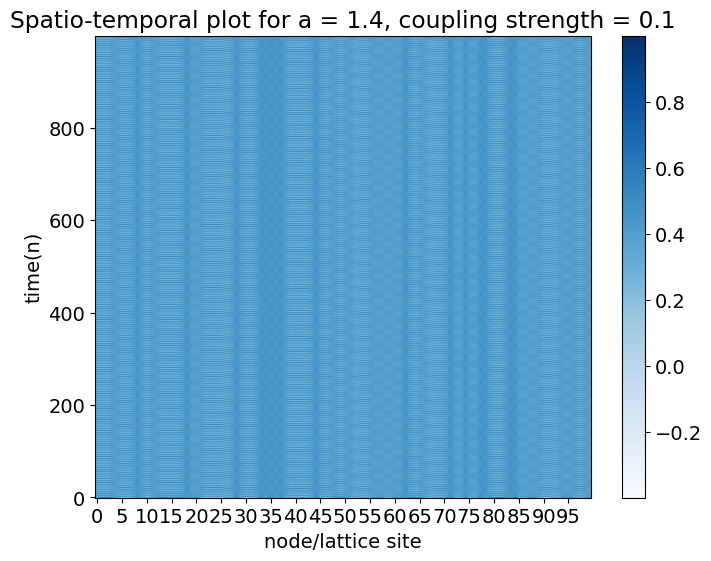

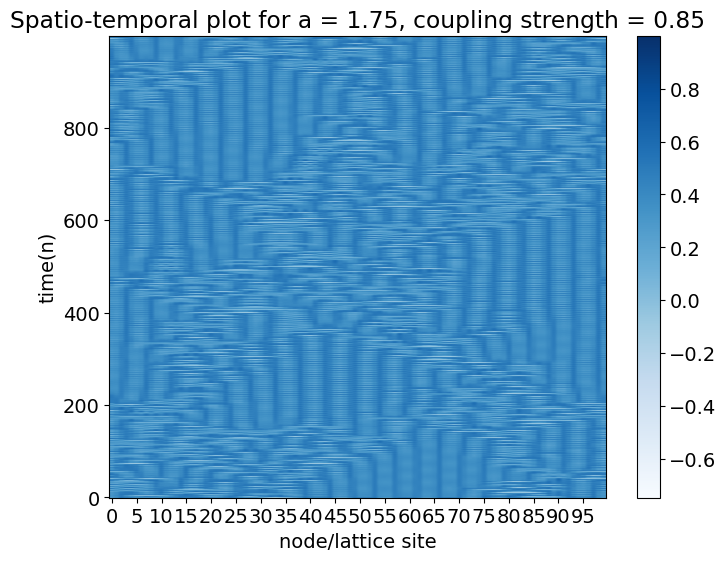

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx

# Set font size for plots
plt.rcParams.update({'font.size': 14})

# Parameters
N = 100  # Number of nodes
G = nx.cycle_graph(N)  # Create a cycle graph

# Function to draw the network
def draw_network(G, X):
    plt.figure(figsize=(4, 4))
    pos = nx.circular_layout(G)
    vmin, vmax = -1, 1
    nx.draw(G, pos, node_color=X, node_size=30, cmap='coolwarm')
    sm = plt.cm.ScalarMappable(cmap='coolwarm', norm=plt.Normalize(vmin=vmin, vmax=vmax))
    sm.set_array([])
    #plt.colorbar(sm, label='Node Values')  # Add colorbar with label
    #plt.title('Network Visualization')
    A = nx.to_numpy_array(G)  # Use numpy array instead of matrix
    return A

# Initialize node values
X_ini = np.random.rand(N)
adj_matrix = draw_network(G, X_ini)

# Convert adjacency matrix to a NumPy array for plotting
adj_matrix = np.array(adj_matrix)

# Plot adjacency matrix
plt.figure(figsize=(6, 4))
im = plt.imshow(adj_matrix, cmap='binary', origin='upper', aspect='auto')  # Save the mappable
plt.colorbar(im, label='Adjacency Values')  # Pass the mappable explicitly to plt.colorbar
ax = plt.gca()
ticks = np.arange(0, N, 5)
ax.set_xticks(np.arange(0.5, N, 1), minor=True)
ax.set_yticks(np.arange(0.5, N, 1), minor=True)
ax.set_yticks(ticks)
ax.set_xticks(ticks)
ax.grid(which='minor')
plt.title('Adjacency Matrix')
plt.show()
#defining the function
def my_map(a, x):
    return 1 - a*x*x
#the iterating function
def iterate_my_system(f,A,X_ini,e,a,iterations=1000,n = 1, M = 100):

    N = len(X_ini) #number of maps/nodes, check that len(X_ini) = len(A)
    X = np.zeros([N,iterations]) #to store spatio-temporal dynamics, each row for a particular node
    X[:,0] = X_ini #initial conditions

    for k in range(1,iterations): #k is the index of time here
        coupling_term = np.sum(np.multiply(A,f(a,X[:,k-1])).T,axis=0)
        X[:,k] = (1-e)*f(a,X[:,k-1])+0.5*e*coupling_term
        #print(X.T)
    #to see the spatio-temporal plot
    plt.figure().set_size_inches(8,6)
    plt.imshow(X.T[-M::n,:],origin='lower',aspect='auto',cmap='Blues')
    #plt.imshow(X,origin='lower',aspect='auto',cmap='Blues_r')
    plt.colorbar()
    plt.xticks(np.arange(0, X.shape[0], 5))
    plt.xlabel('node/lattice site')
    plt.ylabel('time(n)')
    plt.title('Spatio-temporal plot for a = '+str(a)+', coupling strength = '+str(e))
    plt.show()

    return X   

X_all = iterate_my_system(my_map,adj_matrix,np.random.rand(N),0.5,1.69,2000,1,1000)
X_all = iterate_my_system(my_map,adj_matrix,np.random.rand(N),0.5,1.67,100000,2000)
X_all = iterate_my_system(my_map,adj_matrix,np.random.rand(N),0.1,1.895,2000,1,1000)
X_all = iterate_my_system(my_map,adj_matrix,np.random.rand(N),0.1,1.4,2000,1,1000)



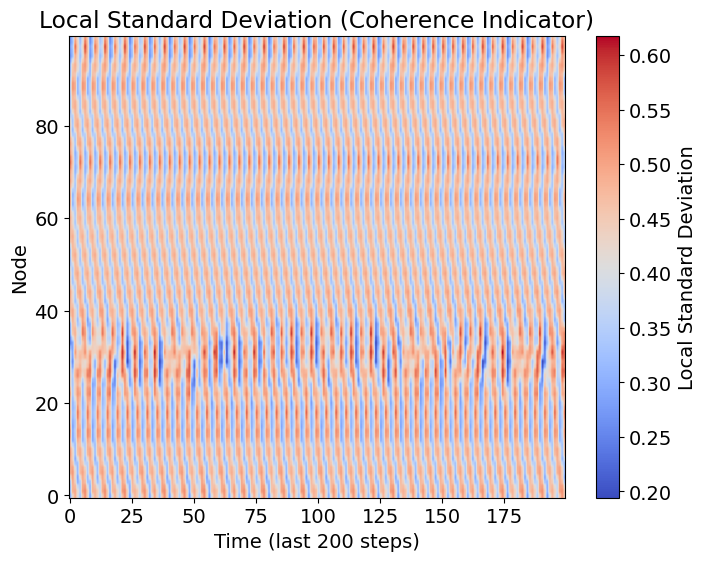

In [ ]:
def local_order(X, window=5):
    """
    Compute local standard deviation to assess coherence in small neighborhoods.
    
    X: Spatiotemporal data (nodes x time)
    window: Number of neighbors to consider for local coherence
    """
    N, T = X.shape
    local_std = np.zeros((N, T))
    
    for i in range(N):
        # Neighborhood indices (periodic boundary)
        neighbors = [(i + j) % N for j in range(-window, window + 1)]
        # Compute standard deviation across neighborhood
        local_std[i, :] = np.std(X[neighbors, :], axis=0)
    
    return local_std

# Compute local order parameter
local_std = local_order(X_all)
plt.figure(figsize=(8, 6))
plt.imshow(local_std[:, -200:], origin='lower', aspect='auto', cmap='coolwarm')
plt.colorbar(label='Local Standard Deviation')
plt.xlabel('Time (last 200 steps)')
plt.ylabel('Node')
plt.title('Local Standard Deviation (Coherence Indicator)')
plt.show()


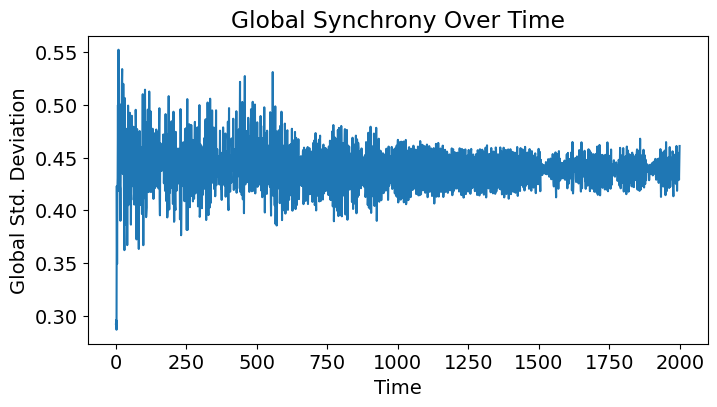

In [ ]:
def global_synchrony(X):
    """
    Compute global standard deviation across all nodes over time.
    """
    return np.std(X, axis=0)

# Compute global synchrony
global_std = global_synchrony(X_all)
plt.figure(figsize=(8, 4))
plt.plot(global_std)
plt.xlabel('Time')
plt.ylabel('Global Std. Deviation')
plt.title('Global Synchrony Over Time')
plt.show()


# Possibly chimera State

C:\Users\sutir\AppData\Local\Temp\ipykernel_21596\509193749.py:25: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  coupling = sum(logistic_map(x[(i + j) % N], a) for j in range(-R, R + 1))


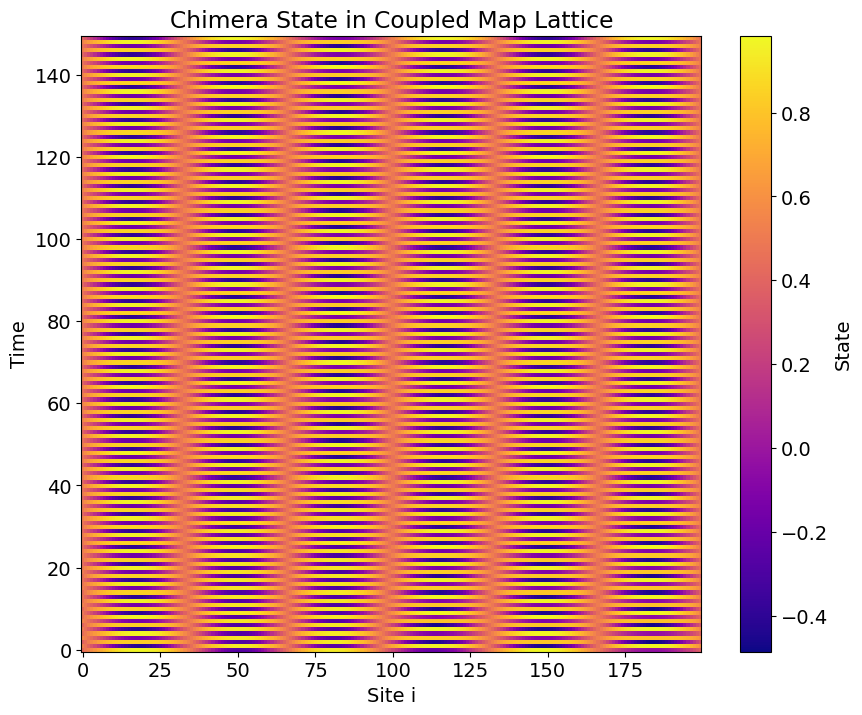

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Parameters
N = 200             # Number of nodes in the lattice
R = 12              # Coupling range (adjust this to get chimera state)
a = 1.75            # Logistic map parameter
epsilon = 0.85     # Coupling strength (adjust for chimera behavior)
iterations = 200    # Number of time steps
transient = 50      # Skip initial transient steps

# Initialize the lattice with random values between -1 and 1
x = np.random.uniform(-1, 1, N)
states = np.zeros((iterations, N))

# Define the logistic map
def logistic_map(x, a):
    return 1 - a * x**2

# Evolve the coupled map lattice
for t in range(iterations):
    x_new = np.zeros(N)
    for i in range(N):
        # Coupling term with periodic boundary conditions
        coupling = sum(logistic_map(x[(i + j) % N], a) for j in range(-R, R + 1))
        coupling /= (2 * R + 1)
        x_new[i] = (1 - epsilon) * logistic_map(x[i], a) + epsilon * coupling
    x = x_new
    states[t] = x

# Plotting the results
plt.figure(figsize=(10, 8))
plt.imshow(states[transient:], aspect='auto', cmap='plasma', origin='lower')
plt.colorbar(label='State')
plt.xlabel('Site i')
plt.ylabel('Time')
plt.title('Chimera State in Coupled Map Lattice')
plt.show()


# Using different map than logistic (SOM:Self Organizing Map)

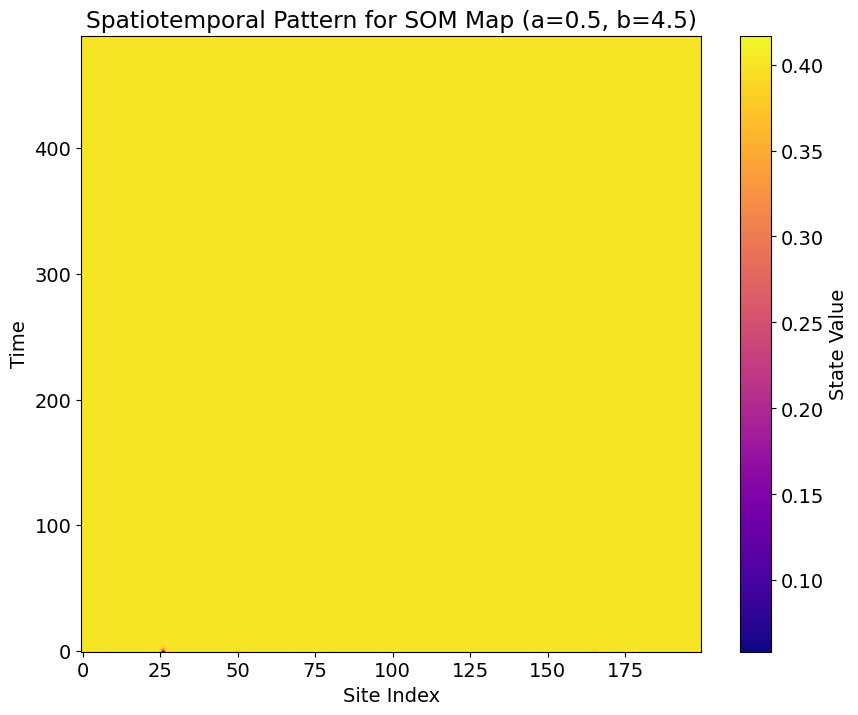

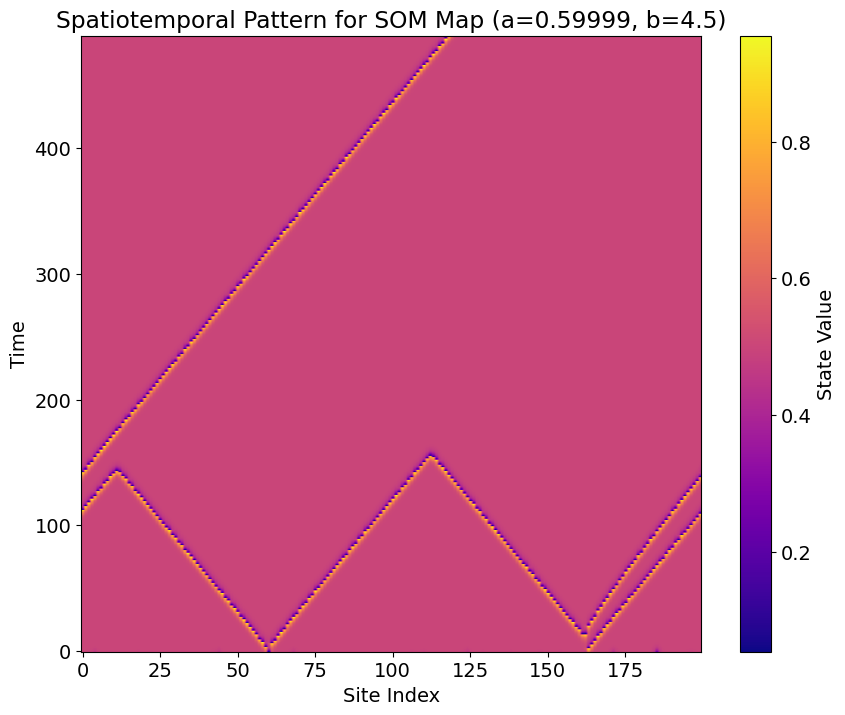

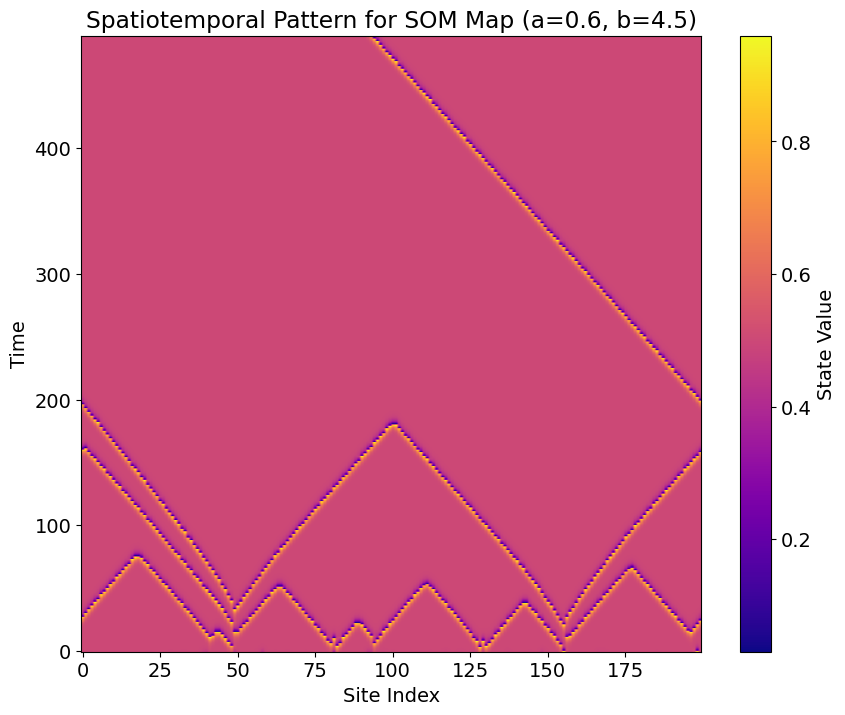

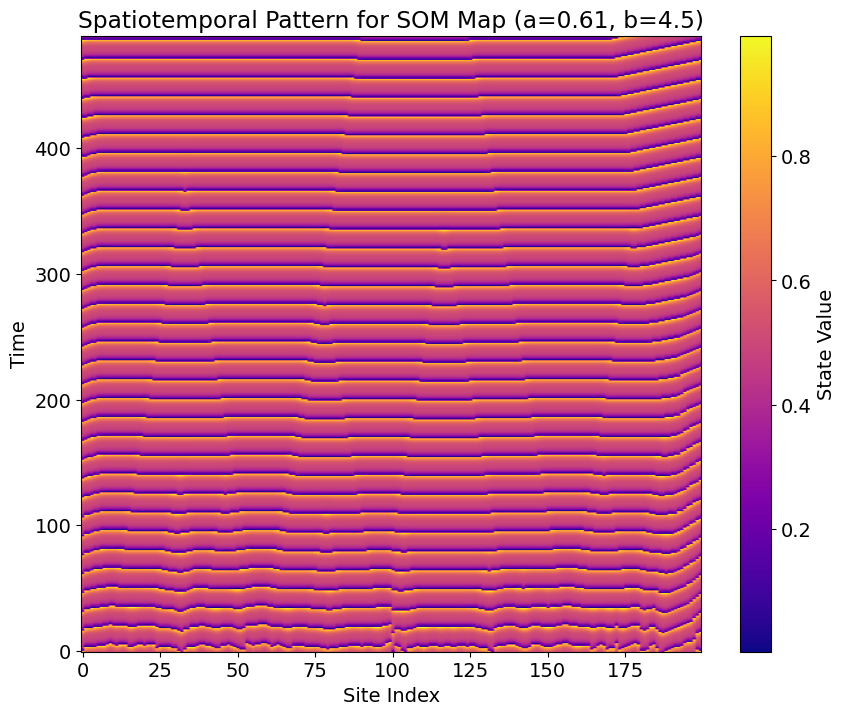

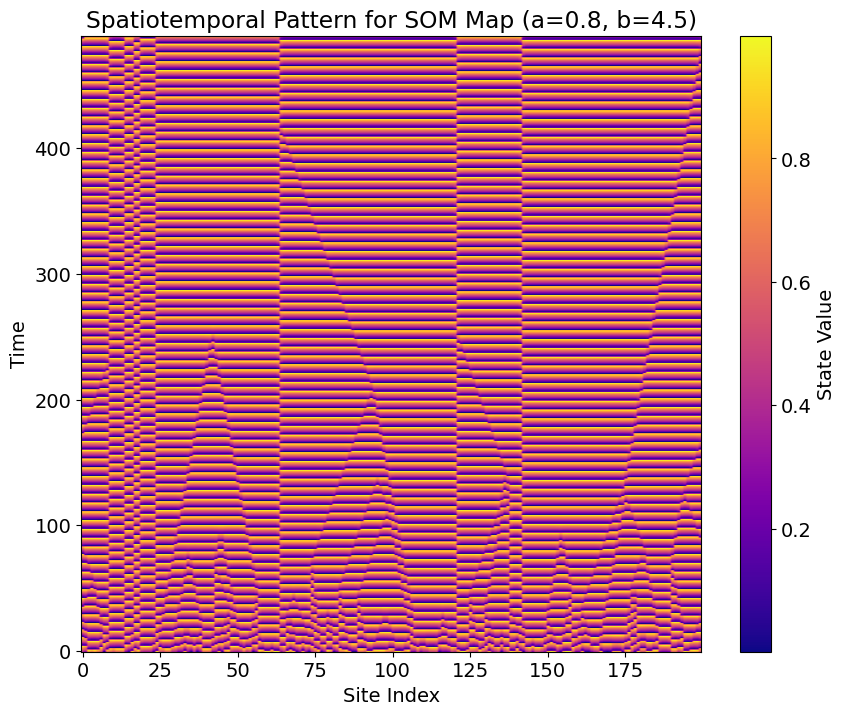

...

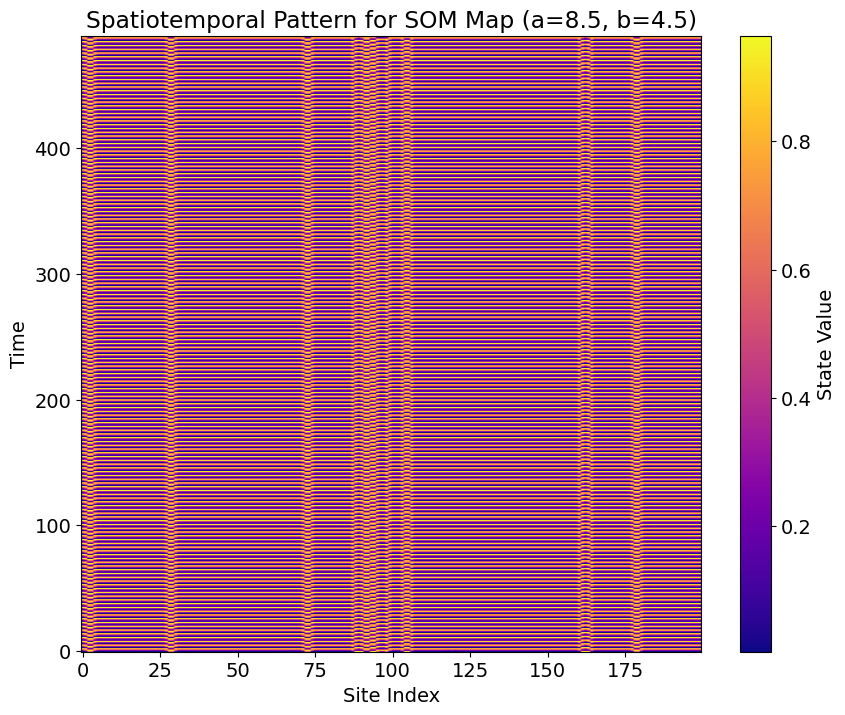

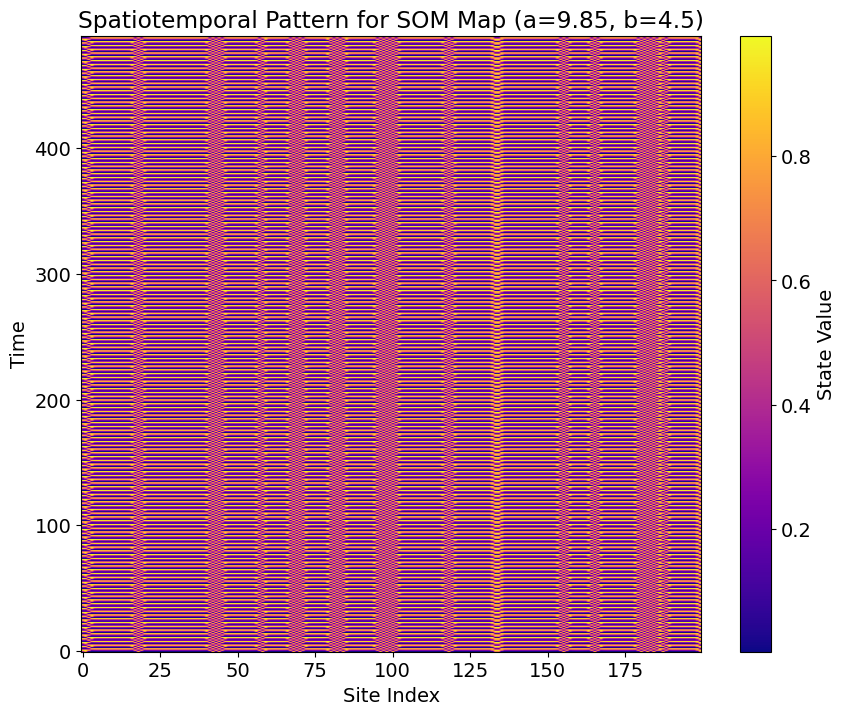

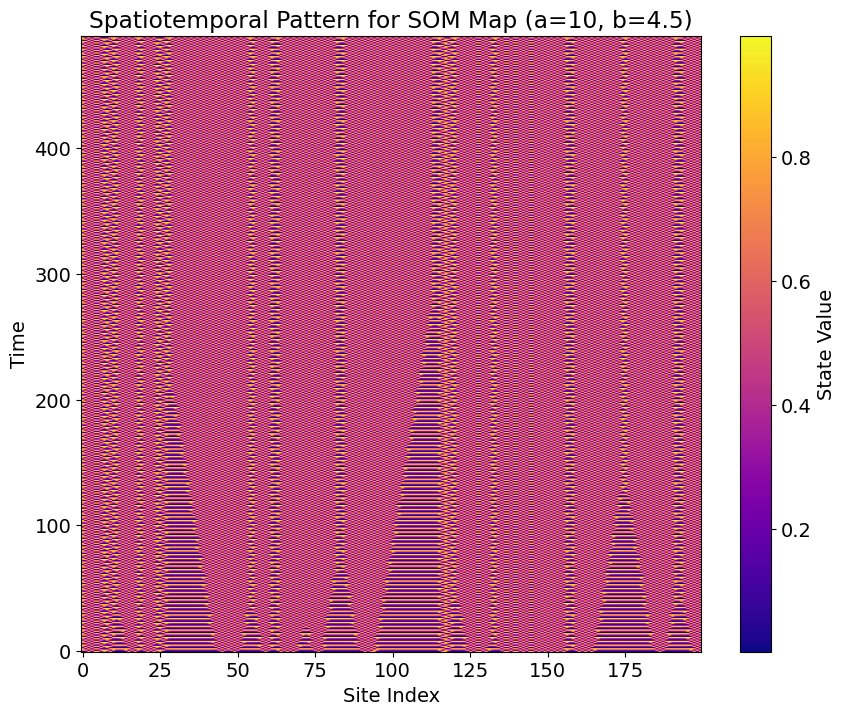

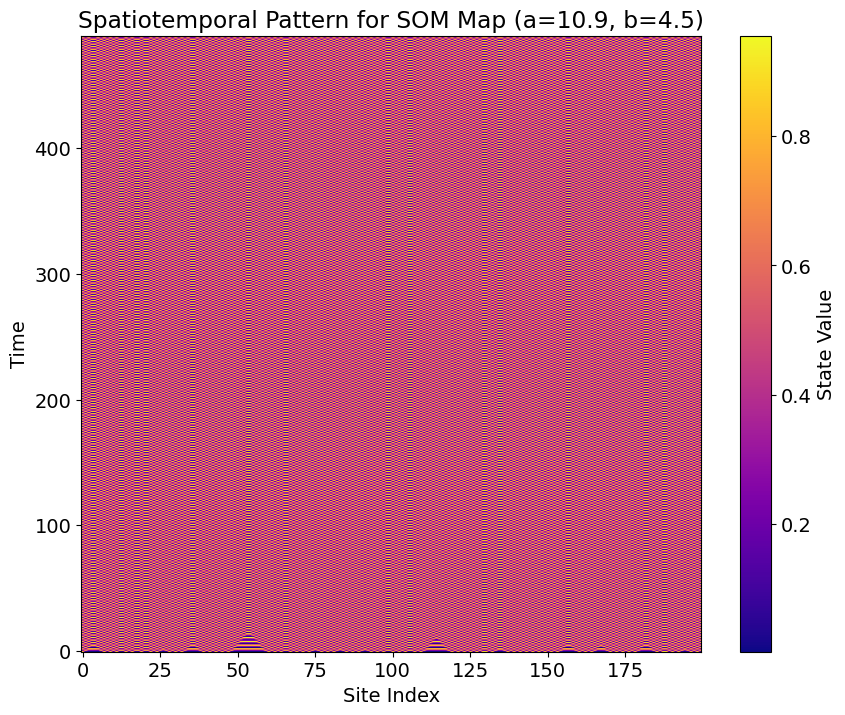

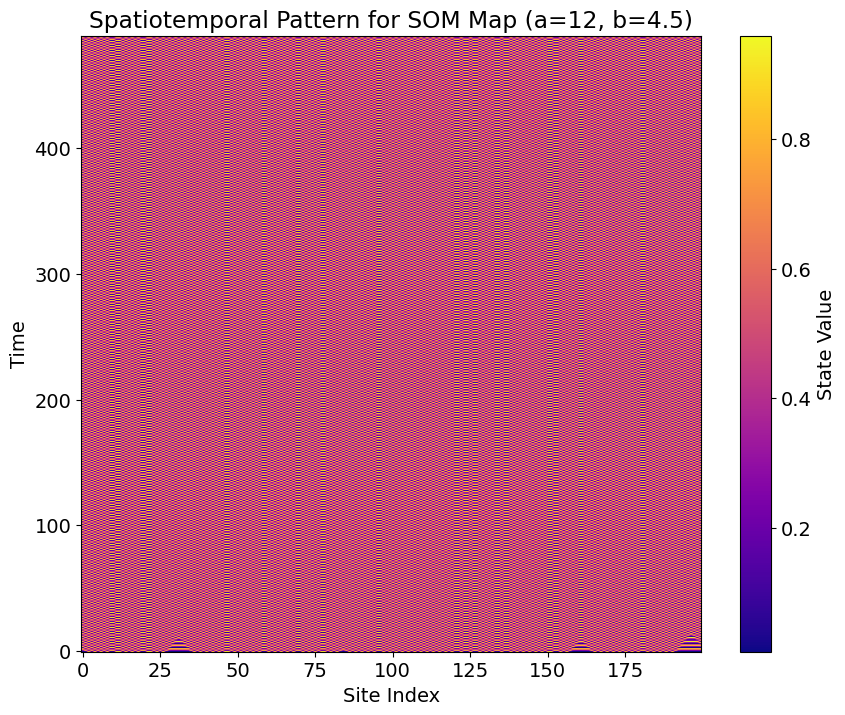

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

class SOMMap:
    def __init__(self):
        # Parameters for SOM map
        self.params = {}

    def set_params(self, params):
        """ Set parameters for the SOM map """
        self.params = params

    def get_params(self):
        """ Retrieve parameters for the SOM map """
        return self.params

    def som_map(self, x):
        """ SOM map function """
        a, b = self.get_params()
        gamma = 0.8 / (1.0 + a)
        if x < gamma:
            return a * x + 0.2
        elif x < 0.8:
            return (x - 0.8) / a + 1.0
        else:
            return (1.0 - x) / b

def run_som_simulation(som_map, N=200, epsilon=0.1, iterations=500, transient=10, param_range=np.linspace(5, 15, 5)):
    """
    Run a simulation of the SOM map with different parameter ranges and generate plots.
    """
    for param in param_range:
        som_map.set_params([param, 4.5])  # Set different parameter values
        
        # Initialize the lattice with random values between 0 and 1
        lattice = np.random.uniform(0, 1, N)
        states = np.zeros((iterations, N))
        
        # Run the CML for the given number of iterations
        for t in range(iterations):
            new_lattice = np.zeros(N)
            for i in range(N):
                # Calculate coupling with periodic boundary conditions
                left = lattice[(i - 1) % N]
                right = lattice[(i + 1) % N]
                
                # Update rule: local map + coupling
                new_lattice[i] = (1 - epsilon) * som_map.som_map(lattice[i]) + (epsilon / 2) * (som_map.som_map(left) + som_map.som_map(right))
            
            lattice = new_lattice
            states[t] = lattice
        
        # Plot the spatiotemporal pattern for the current parameter value
        plt.figure(figsize=(10, 8))
        plt.imshow(states[transient:], aspect='auto', cmap='plasma', origin='lower')
        plt.colorbar(label='State Value')
        plt.xlabel('Site Index')
        plt.ylabel('Time')
        plt.title(f'Spatiotemporal Pattern for SOM Map (a={param}, b=4.5)')
        plt.show()

# Example Usage
som_map = SOMMap()


# Generate plots for different ranges of 'a'
param_range =[0.5,0.59999,0.60,0.61,0.8,0.9,4.5,4.6,7.5,8.5,9.85,10,10.9,12]  # Range for parameter 'a'
run_som_simulation(som_map, param_range=param_range)


# Animations

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
%matplotlib inline

def my_map(a, x):
    return 1 - a*x*x

def iterate_my_system(f, A, X_ini, e, a, iterations=1000, n=1, M=100):
    N = len(X_ini)
    X = np.zeros([N, iterations])
    X[:,0] = X_ini
    
    for k in range(1, iterations):
        coupling_term = np.sum(np.multiply(A, f(a, X[:,k-1])).T, axis=0)
        X[:,k] = (1-e)*f(a, X[:,k-1]) + 0.5*e*coupling_term
    
    return X

def create_animation(X_all, a, e, update_interval=50):
    plt.ioff()
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    
    # Static space-time plot (left subplot)
    im1 = ax1.imshow(X_all.T, origin='lower', aspect='auto', cmap='viridis')
    ax1.set_xlabel('Lattice site')
    ax1.set_ylabel('Time')
    ax1.set_title(f'Space-time plot\na={a}, coupling={e}')
    plt.colorbar(im1, ax=ax1)
    
    # Animated spatial profile (right subplot)
    lattice_sites = np.arange(X_all.shape[0])
    line, = ax2.plot([], [], 'r-', lw=2)
    ax2.set_xlim(0, X_all.shape[0]-1)
    ax2.set_ylim(np.min(X_all)-0.1, np.max(X_all)+0.1)
    ax2.set_xlabel('Lattice site')
    ax2.set_ylabel('Amplitude')
    ax2.grid(True)
    
    # Add time indicator on the space-time plot
    time_line = ax1.axhline(y=0, color='r', linestyle='--')
    
    def init():
        line.set_data([], [])
        time_line.set_ydata(0)
        return line, time_line
    
    def update(frame):
        # Update spatial profile
        line.set_data(lattice_sites, X_all[:, frame])
        # Update time indicator
        time_line.set_ydata(frame)
        ax2.set_title(f'Spatial profile at time = {frame}')
        return line, time_line
    
    anim = FuncAnimation(fig, update, frames=X_all.shape[1],
                        init_func=init, interval=update_interval, 
                        blit=True)
    
    plt.close()
    return HTML(anim.to_jshtml())

# Example usage:
N = 50  # Number of lattice sites
iterations = 2000

# Create adjacency matrix (ring coupling)
adj_matrix = np.zeros((N, N))
for i in range(N):
    adj_matrix[i, (i+1)%N] = 1
    adj_matrix[i, (i-1)%N] = 1

# Initial conditions and parameters
X_ini = np.random.rand(N)
epsilon = 0.1  # coupling strength
a = 1.85      # map parameter

# Generate the data
X_all = iterate_my_system(my_map,adj_matrix,np.random.rand(N),0.5,1.69,2000,1,1000)

# Create and display the animation
animation = create_animation(X_all, a=a, e=epsilon, update_interval=50)
display(animation)

C:\Users\sutir\AppData\Local\Temp\ipykernel_21596\661542159.py:46: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  time_line.set_ydata(0)
C:\Users\sutir\AppData\Local\Temp\ipykernel_21596\661542159.py:46: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  time_line.set_ydata(0)
C:\Users\sutir\AppData\Local\Temp\ipykernel_21596\661542159.py:53: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  time_line.set_ydata(frame)


KeyboardInterrupt: 

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
%matplotlib inline

def my_map(a, x):
    return 1 - a*x*x

def iterate_my_system(f, A, X_ini, e, a, iterations=1000, n=1, M=100):
    N = len(X_ini)
    X = np.zeros([N, iterations])
    X[:,0] = X_ini
    
    for k in range(1, iterations):
        coupling_term = np.sum(np.multiply(A, f(a, X[:,k-1])).T, axis=0)
        X[:,k] = (1-e)*f(a, X[:,k-1]) + 0.5*e*coupling_term
    
    return X

def create_animation(X_all, a, e, update_interval=50):
    plt.ioff()
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    
    # Static space-time plot (left subplot)
    im1 = ax1.imshow(X_all.T, origin='lower', aspect='auto', cmap='viridis')
    ax1.set_xlabel('Lattice site')
    ax1.set_ylabel('Time')
    ax1.set_title(f'Space-time plot\na={a}, coupling={e}')
    plt.colorbar(im1, ax=ax1)
    
    # Animated spatial profile (right subplot)
    lattice_sites = np.arange(X_all.shape[0])
    line, = ax2.plot([], [], 'r-', lw=2)
    ax2.set_xlim(0, X_all.shape[0]-1)
    ax2.set_ylim(np.min(X_all)-0.1, np.max(X_all)+0.1)
    ax2.set_xlabel('Lattice site')
    ax2.set_ylabel('Amplitude')
    ax2.grid(True)
    
    # Add time indicator on the space-time plot
    time_line = ax1.axhline(y=0, color='r', linestyle='--')
    
    def init():
        line.set_data([], [])
        time_line.set_ydata(0)
        return line, time_line
    
    def update(frame):
        # Update spatial profile
        line.set_data(lattice_sites, X_all[:, frame])
        # Update time indicator
        time_line.set_ydata(frame)
        ax2.set_title(f'Spatial profile at time = {frame}')
        return line, time_line
    
    anim = FuncAnimation(fig, update, frames=X_all.shape[1],
                        init_func=init, interval=update_interval, 
                        blit=True)
    
    plt.close()
    return HTML(anim.to_jshtml())

# Example usage:
N = 100 # Number of lattice sites
iterations = 2000

# Create adjacency matrix (ring coupling)
adj_matrix = np.zeros((N, N))
for i in range(N):
    adj_matrix[i, (i+1)%N] = 1
    adj_matrix[i, (i-1)%N] = 1

# Initial conditions and parameters
X_ini = np.random.rand(N)
epsilon = 0.5  # coupling strength
a = 1.69     # map parameter

# Generate the data
X_all = iterate_my_system(my_map, adj_matrix, X_ini, epsilon, a, iterations)

# Create and display the animation
animation = create_animation(X_all, a=a, e=epsilon, update_interval=100)
display(animation)

C:\Users\sutir\AppData\Local\Temp\ipykernel_21596\1353548068.py:46: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  time_line.set_ydata(0)
C:\Users\sutir\AppData\Local\Temp\ipykernel_21596\1353548068.py:46: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  time_line.set_ydata(0)
C:\Users\sutir\AppData\Local\Temp\ipykernel_21596\1353548068.py:53: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  time_line.set_ydata(frame)


KeyboardInterrupt: 

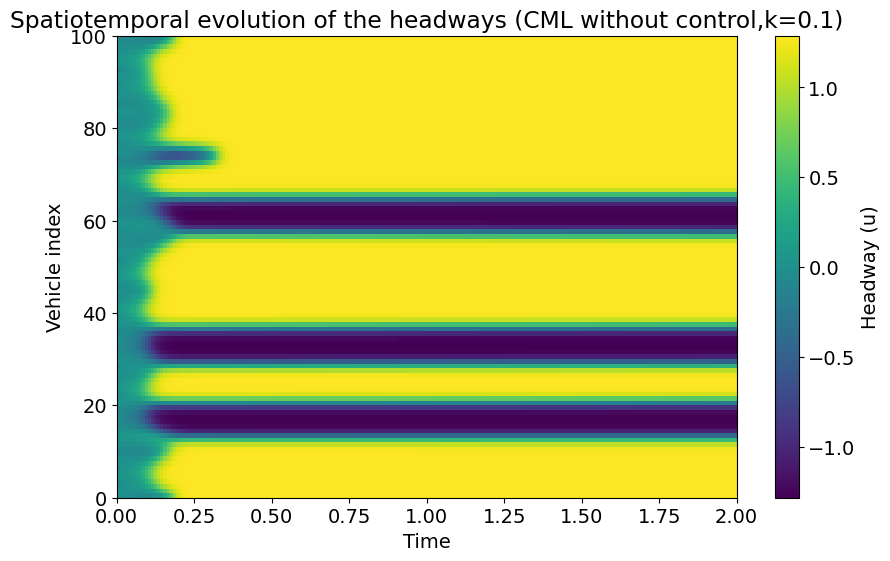

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Parameters
vmax = 3        # Maximum speed
hc = 1.0            # Safety distance
epsilon = 0.5       # Coupling coefficient
alpha = 0.5        # Symmetry parameter
k =0.1  # Feedback coefficient
num_vehicles = 100 # Number of vehicles (lattice size)
num_iterations = 200 # Number of time steps
delta_t = 0.01       # Time step size

# Define the local map f(u)
def f(u):
    return (vmax / 2) * np.tanh(u)

# Initialize the headways (u) randomly around 0
u = np.random.uniform(-0.1, 0.1, num_vehicles)

# Initialize a matrix to store the evolution of u over time
u_history = np.zeros((num_iterations, num_vehicles))
u_history[0] = u

# Time evolution
for t in range(1, num_iterations):
    u_new = np.zeros(num_vehicles)
    for j in range(num_vehicles):
        # Neighboring indices with periodic boundary conditions
        j_prev = (j - 1) % num_vehicles
        j_next = (j + 1) % num_vehicles

        # Calculate the new state with feedback control
        local_coupling = (1 - epsilon) * f(u[j])
        neighbor_coupling = epsilon * ((1 - alpha) * f(u[j_prev]) + alpha * f(u[j_next]))
        feedback_control = -k * (f(u[j]) - u[j])

        u_new[j] = local_coupling + neighbor_coupling + feedback_control

    # Update the state and store it in history
    u = u_new
    u_history[t] = u

# Plot the spatiotemporal evolution of the headways
plt.figure(figsize=(10, 6))
plt.imshow(u_history.T, aspect='auto', cmap='viridis', origin='lower',
           extent=[0, num_iterations * delta_t, 0, num_vehicles])
plt.colorbar(label='Headway (u)')
plt.xlabel('Time')
plt.ylabel('Vehicle index')
plt.title('Spatiotemporal evolution of the headways (CML without control,k=0.1)')
plt.show()
